In [1]:
import os # 환경 변수나 디렉터리, 파일 등의 OS 자원을 제어할 수 있게 해주는 모듈
import cv2 # OpenCV라이브러리 → 컴퓨터 비전 관련 프로그래밍을 쉽게 할 수 있도록 도와주는 라이브러리
import matplotlib.pyplot as plt # 다양한 데이터를 많은 방법으로 도식화 할 수 있도록 하는 라이브러리
import numpy as np # 다차원 배열을 쉽게 처리하고 효율적으로 사용할 수 있도록 하는 라이브러리
import dlib # 이미지 처리 및 기계 학습, 얼굴인식 등을 할 수 있는 c++ 로 개발된 고성능의 라이브러리 
import math # 각도구하기용 수학
import os

In [2]:
sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat_nose.png' # 왕관 이미지의 경로
img_sticker = cv2.imread(sticker_path,cv2.IMREAD_UNCHANGED) # 스티커 이미지를 불러옵니다 // cv2.imread(이미지 경로) → image객체 행렬을 반환

my_image_path = '/aiffel/aiffel/camera_sticker/images/AMI7A2923.jpg' # 본인 이미지가 있는 경로를 가지고 온다.
# img_bgr = cv2.imread(my_image_path)    # OpenCV로 이미지를 불러옵니다
# img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다
# plt.imshow(img_bgr) # 이미지를 출력하기 위해 출력할 이미지를 올려준다. (실제 출력은 하지 않음)
# print(img_bgr.shape)
# plt.show() # 이미지를 출력해준다. (실제 출력)

In [3]:
# detector를 선언합니다
detector_hog = dlib.get_frontal_face_detector() # 기본 얼굴 감지기를 반환

In [4]:
#landmark 모델을 불러옵니다

model_path = '/aiffel/aiffel/camera_sticker/models/shape_predictor_68_face_landmarks.dat'
    # 저장한 landmark 모델의 주소를 model_path 변수에 저장
landmark_predictor = dlib.shape_predictor(model_path)
    # dlib 라이브러리의 shape_predictor 함수를 이용하여 모델을 불러옴
    # landmark_predictor는 RGB이미지와 dlib.rectangle를 입력 받고 dlib.full_object_detection를 반환
    # dlib.rectangle: 내부를 예측하는 박스
    # dlib.full_object_detection: 각 구성 요소의 위치와, 이미지 상의 객체의 위치를 나타냄

In [5]:
#이미지를 불러와서 보여줍니다.
def imageLoad(path):
    img_bgr = cv2.imread(path)    # OpenCV로 이미지를 불러옵니다
    fileNm = os.path.basename(path)
    img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다
#     plt.imshow(img_bgr) # 이미지를 출력하기 위해 출력할 이미지를 올려준다. (실제 출력은 하지 않음)
# #     print(img_bgr.shape)
#     plt.title(fileNm+' BGR Mode')
#     plt.show() # 이미지를 출력해준다. (실제 출력)
    # plt.imshow 이전에 RGB 이미지로 바꾸는 것을 잊지마세요. 
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb) # 이미지 실제 출력하기 위해 이미지를 올려줌 (원하는 사이즈의 픽셀을 원하는 색으로 채워서 만든 그림이라고 합니다.)
    plt.title(fileNm+' RGB Mode')
    plt.show() # 이미지 실제 출력
    return img_bgr, fileNm, img_show, img_rgb
    


In [6]:
# 얼굴을 찾아줍니다
def faceDetect(img_rgb,img_show,fileNm) :
    dlib_rects = detector_hog(img_rgb, 1) # (image, num of image pyramid)
    print("얼굴 영역"+str(dlib_rects))
    for dlib_rect in dlib_rects: # 찾은 얼굴 영역의 좌표
        l = dlib_rect.left() # 왼쪽
        t = dlib_rect.top() # 위쪽
        r = dlib_rect.right() # 오른쪽
        b = dlib_rect.bottom() # 아래쪽

        cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 2, lineType=cv2.LINE_AA) # 시작점의 좌표와 종료점 좌표로 직각 사각형을 그림

    img_show_rgb =  cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
    plt.imshow(img_show_rgb)
    plt.title(fileNm+' Face Rect')
    plt.show()
    return dlib_rects

In [7]:
#얼굴 이목구비를 찾아줍니다.
def faceLandMark(dlib_rects,fileNm) :
    print(dlib_rects)
    list_landmarks = []
    # 랜드마크의 위치를 저장할 list 생성    

    # 얼굴 영역 박스 마다 face landmark를 찾아냅니다
    # face landmark 좌표를 저장해둡니다
    for dlib_rect in dlib_rects:
        points = landmark_predictor(img_rgb, dlib_rect)
            # 모든 landmark의 위치정보를 points 변수에 저장
        list_points = list(map(lambda p: (p.x, p.y), points.parts()))
            # 각각의 landmark 위치정보를 (x,y) 형태로 변환하여 list_points 리스트로 저장
        list_landmarks.append(list_points)
            # list_landmarks에 랜드마크 리스트를 저장

#     print(len(list_landmarks[0]))
    # 얼굴이 n개인 경우 list_landmarks는 n개의 원소를 갖고
    # 각 원소는 68개의 랜드마크 위치가 나열된 list 
    # list_landmarks의 원소가 1개이므로 list_landmarks[1]을 호출하면 IndexError가 발생
    for landmark in list_landmarks:
        for point in landmark:
            cv2.circle(img_show, point, 2, (0, 255, 255), 10)
                # cv2.circle: OpenCV의 원을 그리는 함수
                # img_show 이미지 위 각각의 point에
                # 크기가 2이고 (0, 255, 255)색으로 내부가 채워진(-1) 원을 그림
                # (마지막 인수가 자연수라면 그만큼의 두께의 선으로 원이 그려짐)

    img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
        # RGB 이미지로 전환
#     plt.figure(figsize=(15, 15))
    plt.imshow(img_show_rgb)
    plt.title(fileNm+' Face landmarks')
    # 이미지를 준비
    plt.show()
    # 이미지를 출력
    return list_landmarks

In [8]:
#스티커를 얼굴영역에 맞춰 가공합니다.
def makeSticker(dlib_rects,list_landmarks) : 
    list_img_sticker_coord = []
    # zip() : 두 그룹의 데이터를 서로 엮어주는 파이썬의 내장 함수
    # dlib_rects와 list_landmarks 데이터를 엮어 주었음
    # dlib_rects : 얼굴 영역을 저장하고 있는 값
    for dlib_rect, landmark in zip(dlib_rects, list_landmarks): # 얼굴 영역을 저장하고 있는 값과 68개의 랜드마크를 저장하고 있는 값으로 반복문 실행
        print (landmark[33]) # 코끝의 index는 33 입니다
        x = landmark[33][0] # 이미지에서 코 부위의 x값
        y = landmark[33][1] # 이미지에서 코 부위의 y값 
        w = dlib_rect.width() #얼굴영역 가로크기
        h = dlib_rect.height() #얼굴영역 세로크기

        #콧대의 두 점을 이용해서 각도 구하기
        angle = math.atan2(landmark[27][1]-landmark[30][1],landmark[27][0]-landmark[30][0])*180/math.pi
        img_sticker_resize = cv2.resize(img_sticker, (w,h)) # 스티커 이미지 조정 → w,h는 얼굴 영역의 가로를 차지하는 픽셀의 수
        rows, cols = img_sticker_resize.shape[:2]
        rotation_matrix = cv2.getRotationMatrix2D((cols / 2, rows / 2), -angle-90, 1)#스티커 이미지 회전변환행렬 생성

        # 회전된 이미지를 생성합니다.
        img_sticker_rotate = cv2.warpAffine(img_sticker_resize, rotation_matrix, (cols, rows))#스티커 이미지 회전
        img_sticker_rotate,refined_x,refined_y = findCoordinate(x,y,w,h,img_sticker_rotate)

#         print (img_sticker.shape) # 사이즈를 조정한 고양이수염 이미지의 차원 확인 -> (높이, 너비, 차원)
        plt.imshow(img_sticker_rotate)
        plt.title(str(dlib_rect)+'sticker rotate')
            # 스티커 이미지 회전 확인
        plt.show()
#         print (f'(x,y) : ({x},{y})')
#         print (f'(w,h) : ({w},{h})')
        list_img_sticker_coord.append({'img_sticker_rotate' : img_sticker_rotate,'refined_x':refined_x,'refined_y':refined_y })
    return list_img_sticker_coord

In [9]:
#스티커 위치를 반환해 준다
#TODO 예외처리 좀더 해줘야한다
def findCoordinate(x,y,w,h,img_sticker_rotate) :
    
    refined_x = x - w // 2 # x좌표에 중심이 위치하도록 
    refined_y = y - h // 2 # y좌표에 중심이 위치하도록
    # 원본 이미지에 스티커 이미지를 추가하기 위해서 x, y 좌표를 조정합니다. 이미지 시작점은 top-left 좌표이기 때문입니다.
    # 즉, refined_x, refined_y값에서 왕관 이미지가 시작됨
    print (f'(x,y) : ({refined_x},{refined_y})') # 음수 발생 : 이미지 범위를 벗어남
    # 음수값 만큼 왕관 이미지(혹은 추후 적용할 스티커 이미지)를 자른다.
    if refined_x < 0: 
        img_sticker_rotate = img_sticker_rotate[:, -refined_x:]
        refined_x = 0
    # 왕관 이미지를 씌우기 위해 왕관 이미지가 시작할 y좌표 값 조정
    if refined_y < 0:
        img_sticker_rotate = img_sticker_rotate[-refined_y:, :] # refined_y가 -98이므로, img_sticker[98: , :]가 된다. (187, 187, 3)에서 (89, 187, 3)이 됨 (187개 중에서 98개가 잘려나감)
        refined_y = 0
    print (f'(x,y) : ({refined_x},{refined_y})')
    return img_sticker_rotate,refined_x,refined_y

In [10]:
#스티커와 이미지를 합성해준다
#알파값에 따른 배경이미지/스티커이미지 생성 및 원본이미지와 합성
def attachSticker(list_img_sticker_coord, img) :
    for ims_sticker_coord in list_img_sticker_coord :
        refined_x = ims_sticker_coord['refined_x']
        refined_y = ims_sticker_coord['refined_y']
        img_sticker_rotate = ims_sticker_coord['img_sticker_rotate']
        sticker_area = img[refined_y:refined_y+img_sticker_rotate.shape[0], refined_x:refined_x+img_sticker_rotate.shape[1]]
        # PNG 이미지의 알파 채널을 추출합니다.
        alpha_channel = img_sticker_rotate[:, :, 3]
        # PNG 이미지의 BGR 채널을 추출합니다.
        bgr_channels = img_sticker_rotate[:, :, :3]
        # 알파 채널을 3채널로 확장합니다.
        expanded_alpha = cv2.cvtColor(alpha_channel, cv2.COLOR_GRAY2BGR)

        # JPG 이미지와 같은 크기의 배경을 생성합니다.
        background = cv2.multiply((255 - expanded_alpha) / 255, sticker_area, dtype = cv2.CV_32F)

        # PNG 이미지와 같은 크기의 전경을 생성합니다.
        foreground = cv2.multiply(bgr_channels, expanded_alpha / 255, dtype = cv2.CV_32F)
        # 전경과 배경을 합성하여 최종 이미지를 생성합니다.
        result = cv2.add(background, foreground, dtype=cv2.CV_32F)

        #img_show 합성부분을 result로 교체
        img[refined_y:refined_y+img_sticker_rotate.shape[0], refined_x:refined_x+img_sticker_rotate.shape[1]] = \
                result.astype(np.uint8)
    
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

2023052301001718300216831_20230522151304229.jpg


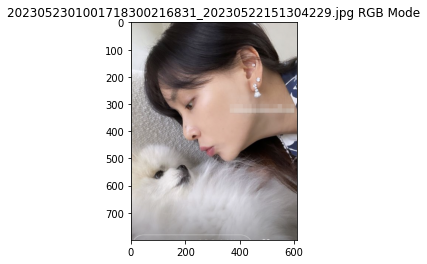

얼굴 영역rectangles[]


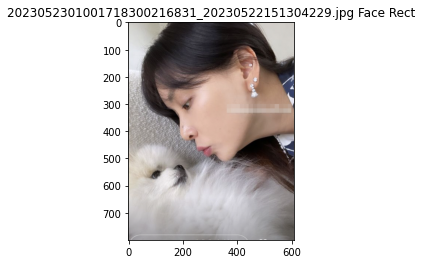

rectangles[]


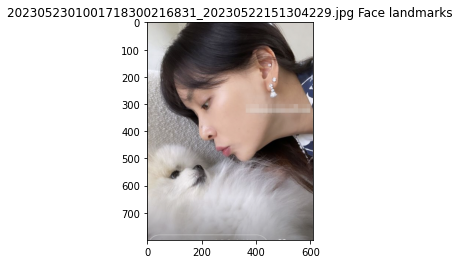

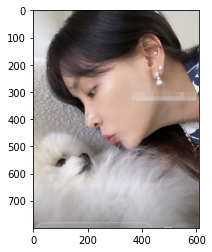

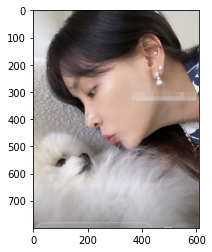

AMI7A2787.jpg


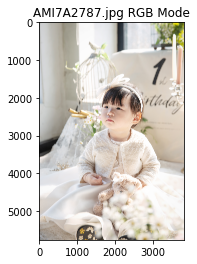

얼굴 영역rectangles[[(3420, 77) (3606, 263)]]


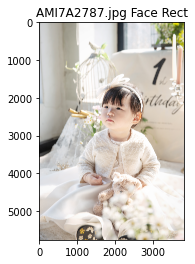

rectangles[[(3420, 77) (3606, 263)]]


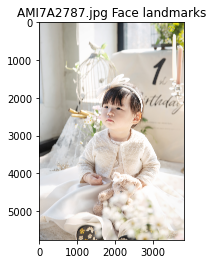

(3505, 196)
(x,y) : (3412,103)
(x,y) : (3412,103)


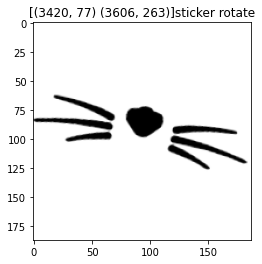

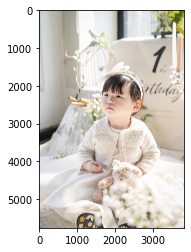

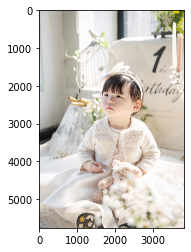

0001255653_001_20230522173501224.jpg


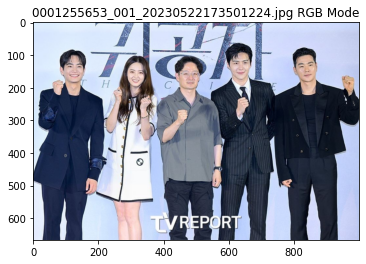

얼굴 영역rectangles[[(605, 108) (667, 170)], [(453, 142) (515, 205)], [(291, 141) (343, 193)], [(805, 115) (868, 177)], [(93, 122) (156, 184)]]


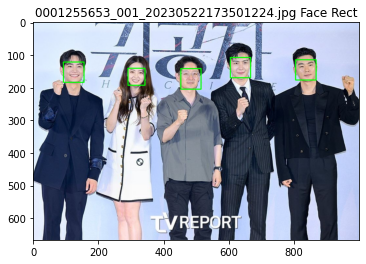

rectangles[[(605, 108) (667, 170)], [(453, 142) (515, 205)], [(291, 141) (343, 193)], [(805, 115) (868, 177)], [(93, 122) (156, 184)]]


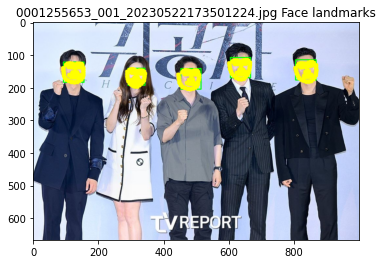

(639, 148)
(x,y) : (608,117)
(x,y) : (608,117)


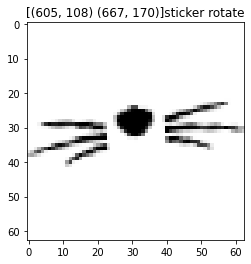

(485, 178)
(x,y) : (454,146)
(x,y) : (454,146)


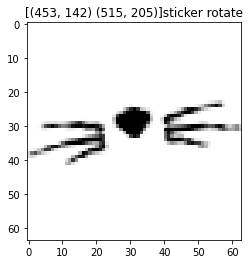

(316, 172)
(x,y) : (290,146)
(x,y) : (290,146)


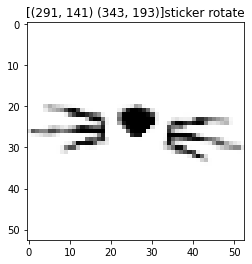

(841, 153)
(x,y) : (809,122)
(x,y) : (809,122)


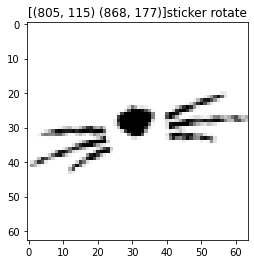

(128, 155)
(x,y) : (96,124)
(x,y) : (96,124)


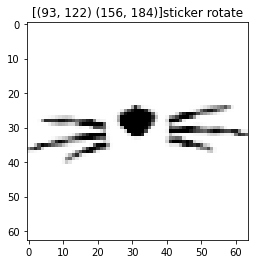

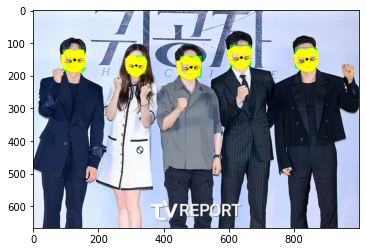

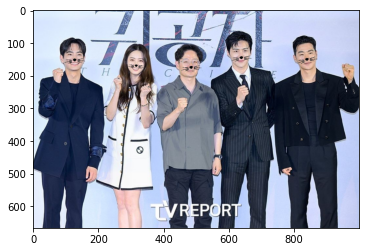

2jin.JPG


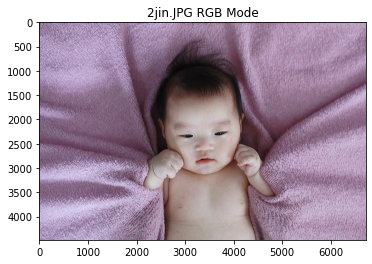

얼굴 영역rectangles[]


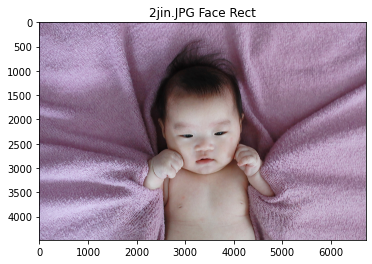

rectangles[]


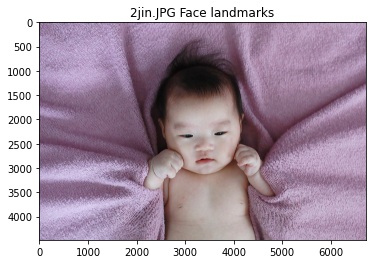

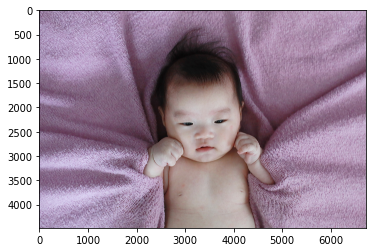

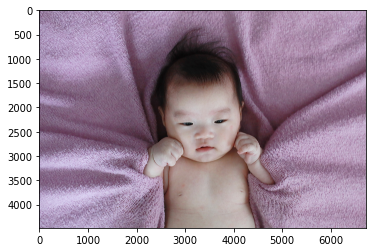

AMI7A2923.jpg


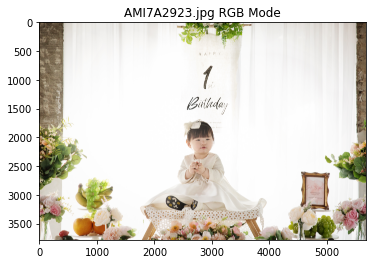

얼굴 영역rectangles[[(2702, 1953) (3023, 2274)]]


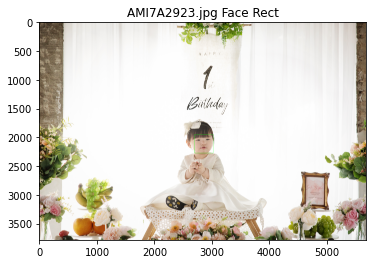

rectangles[[(2702, 1953) (3023, 2274)]]


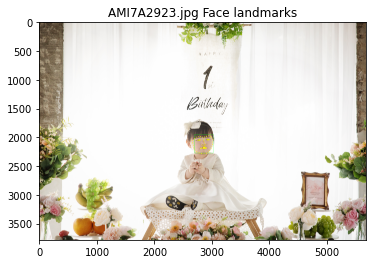

(2864, 2138)
(x,y) : (2703,1977)
(x,y) : (2703,1977)


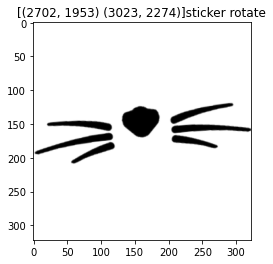

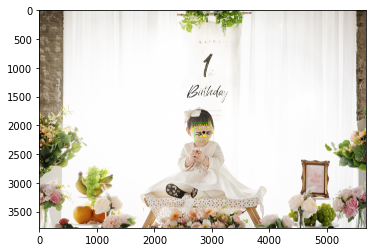

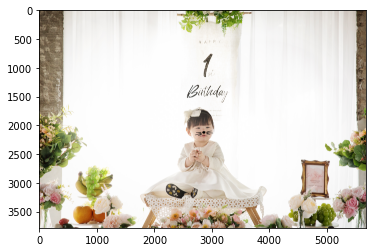

In [11]:
path = '/aiffel/aiffel/camera_sticker/images/'
file_list = os.listdir(path)
file_list_jpg = [file for file in file_list if file.endswith(".jpg") or file.endswith(".JPG")]
for my_image_path in file_list_jpg :
    print(my_image_path)
    img_bgr, fileNm, img_show, img_rgb = imageLoad(path+my_image_path)#이미지 로딩
    dlib_rects = faceDetect(img_rgb,img_show,fileNm)#얼굴 탐색
    list_landmarks = faceLandMark(dlib_rects,fileNm)#이목구비 탐색
    list_img_sticker_coord = makeSticker(dlib_rects,list_landmarks)#스티커 변형
    attachSticker(list_img_sticker_coord, img_show)#스티커 붙이기
#     plt.figure(figsize=(30, 30))
    attachSticker(list_img_sticker_coord, img_bgr)#스티커 붙이기

In [12]:
#밝기조절
def brightnessAdjust(img,fileNm) : 
    # 밝기 조절을 위해 이미지를 HSV 색 공간으로 변환합니다.
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # 이미지의 밝기 채널을 추출합니다.
    v_channel = hsv[:, :, 2]

    # 이미지의 평균 밝기를 계산합니다.
    mean_brightness = int(v_channel.mean())

    # 목표 밝기로 조절할 값입니다. (0이면 아주 어둡고, 255이면 아주 밝음)
    target_brightness = 150

    # 목표 밝기와 현재 밝기의 차이를 계산합니다.
    brightness_diff = target_brightness - mean_brightness

    # 목표 밝기에 맞게 밝기를 조절합니다.
    adjusted_v_channel = cv2.add(v_channel, brightness_diff)

    # 조절된 밝기 채널을 다시 이미지로 병합합니다.
    hsv_adjusted = hsv.copy()
    hsv_adjusted[:, :, 2] = adjusted_v_channel

    # 조정된 HSV 이미지를 다시 BGR 색 공간으로 변환합니다.
    adjusted_image = cv2.cvtColor(hsv_adjusted, cv2.COLOR_HSV2BGR)
    plt.imshow(cv2.cvtColor(adjusted_image, cv2.COLOR_BGR2RGB)) # 이미지 실제 출력하기 위해 이미지를 올려줌 (원하는 사이즈의 픽셀을 원하는 색으로 채워서 만든 그림이라고 합니다.)
    plt.title(fileNm+' BrightnessAdjust')
    plt.show() # 이미지 실제 출력
    return adjusted_image

2023052301001718300216831_20230522151304229.jpg


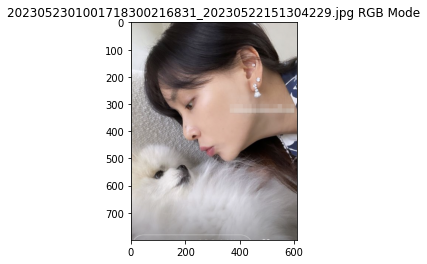

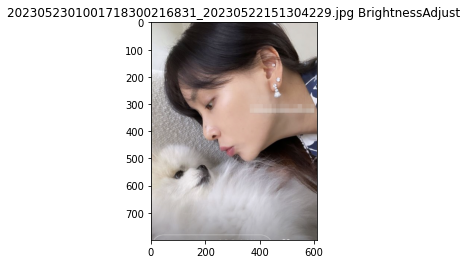

얼굴 영역rectangles[]


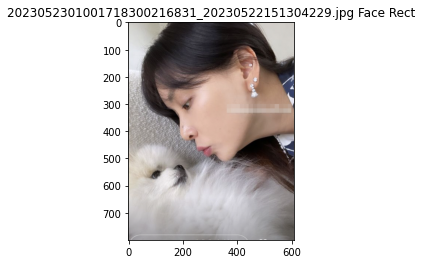

rectangles[]


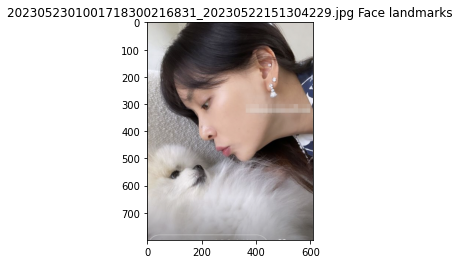

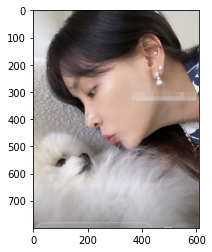

AMI7A2787.jpg


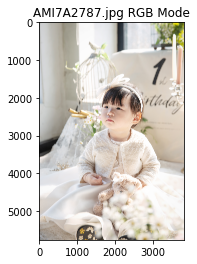

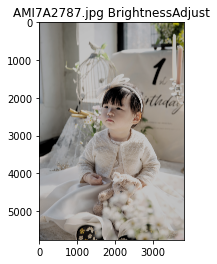

얼굴 영역rectangles[[(3420, 77) (3606, 263)]]


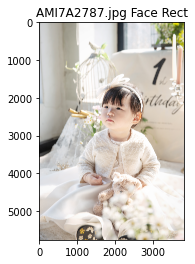

rectangles[[(3420, 77) (3606, 263)]]


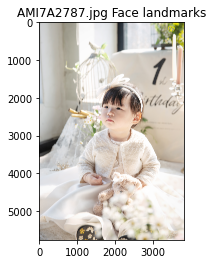

(3505, 196)
(x,y) : (3412,103)
(x,y) : (3412,103)


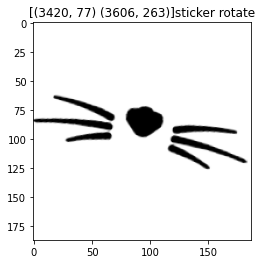

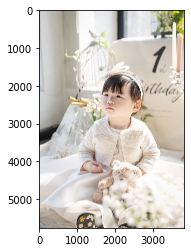

0001255653_001_20230522173501224.jpg


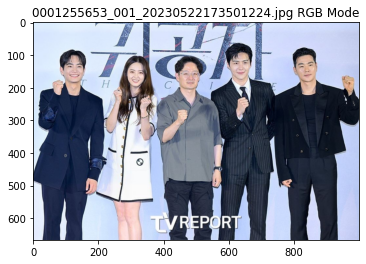

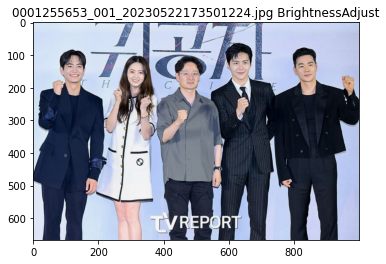

얼굴 영역rectangles[[(605, 108) (667, 170)], [(453, 142) (515, 205)], [(291, 141) (343, 193)], [(805, 115) (868, 177)], [(93, 122) (156, 184)]]


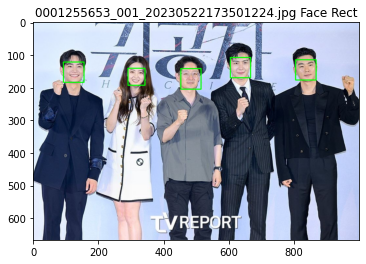

rectangles[[(605, 108) (667, 170)], [(453, 142) (515, 205)], [(291, 141) (343, 193)], [(805, 115) (868, 177)], [(93, 122) (156, 184)]]


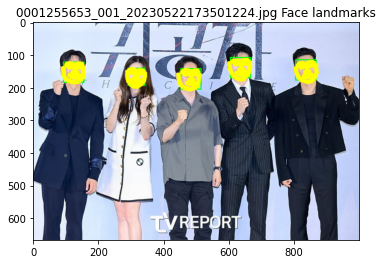

(639, 148)
(x,y) : (608,117)
(x,y) : (608,117)


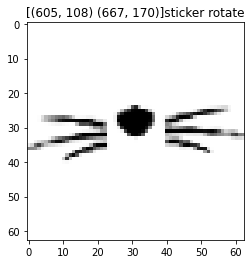

(485, 178)
(x,y) : (454,146)
(x,y) : (454,146)


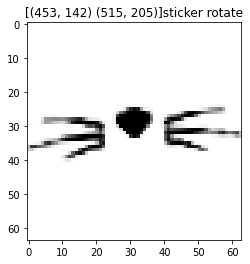

(316, 172)
(x,y) : (290,146)
(x,y) : (290,146)


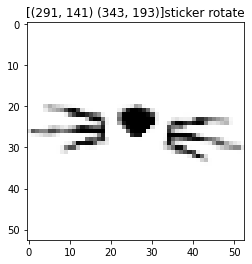

(841, 153)
(x,y) : (809,122)
(x,y) : (809,122)


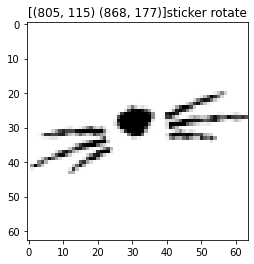

(129, 155)
(x,y) : (97,124)
(x,y) : (97,124)


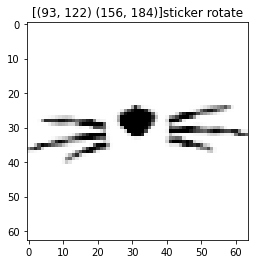

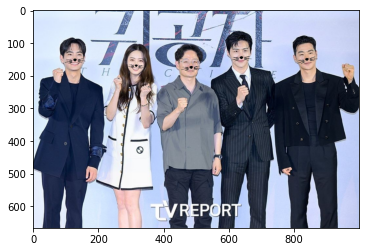

2jin.JPG


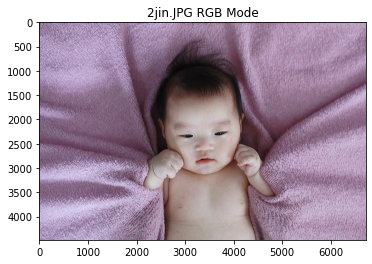

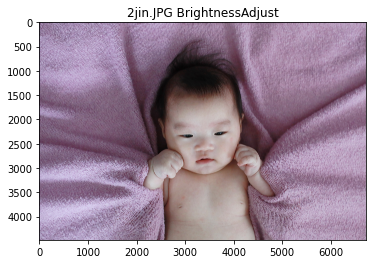

얼굴 영역rectangles[]


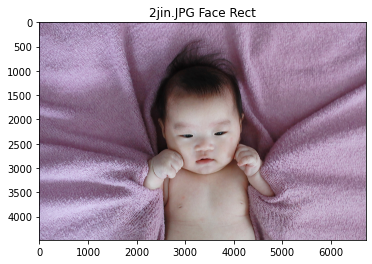

rectangles[]


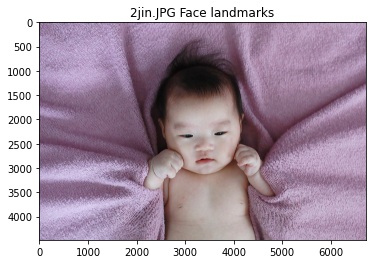

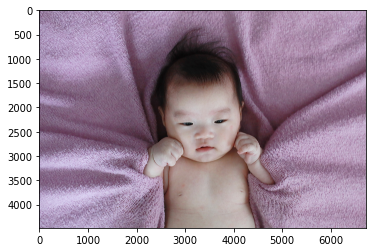

AMI7A2923.jpg


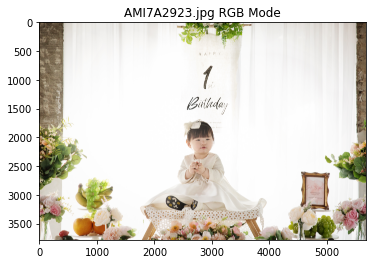

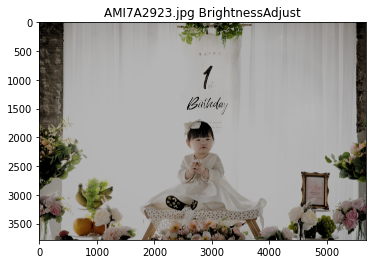

얼굴 영역rectangles[[(2643, 1916) (3029, 2302)]]


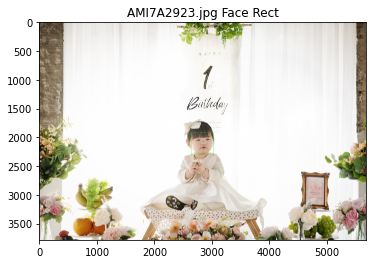

rectangles[[(2643, 1916) (3029, 2302)]]


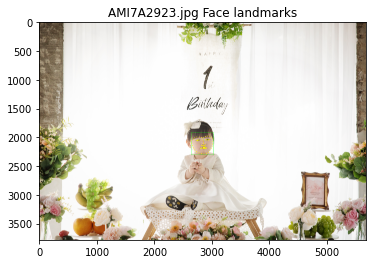

(2855, 2143)
(x,y) : (2662,1950)
(x,y) : (2662,1950)


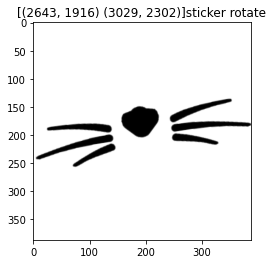

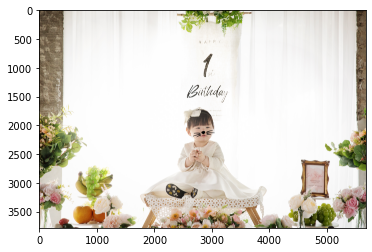

In [13]:
#밝기조절 추가 -> 얼굴 못찾는건 여전히 못찾는다

path = '/aiffel/aiffel/camera_sticker/images/'
file_list = os.listdir(path)
file_list_jpg = [file for file in file_list if file.endswith(".jpg") or file.endswith(".JPG")]
for my_image_path in file_list_jpg :
    print(my_image_path)
    img_bgr, fileNm, img_show, img_rgb = imageLoad(path+my_image_path)#이미지 로딩
    img_rgb = cv2.cvtColor(brightnessAdjust(img_bgr,fileNm), cv2.COLOR_BGR2RGB)
    dlib_rects = faceDetect(img_rgb,img_show,fileNm)#얼굴 탐색
    list_landmarks = faceLandMark(dlib_rects,fileNm)#이목구비 탐색
    list_img_sticker_coord = makeSticker(dlib_rects,list_landmarks)#스티커 변형
#     attachSticker(list_img_sticker_coord, img_show)#스티커 붙이기
#     plt.figure(figsize=(30, 30))
    attachSticker(list_img_sticker_coord, img_bgr)#스티커 붙이기

In [14]:
def contrastAdhust(image,fileNm) :
    # 이미지를 그레이스케일로 변환
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # 명암 조정
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    clahe_image = clahe.apply(gray)
    plt.imshow(cv2.cvtColor(clahe_image, cv2.COLOR_GRAY2RGB)) # 이미지 실제 출력하기 위해 이미지를 올려줌 (원하는 사이즈의 픽셀을 원하는 색으로 채워서 만든 그림이라고 합니다.)
    plt.title(fileNm+' ContrastAdhust')
    plt.show()
    return cv2.cvtColor(clahe_image, cv2.COLOR_GRAY2RGB)

2023052301001718300216831_20230522151304229.jpg


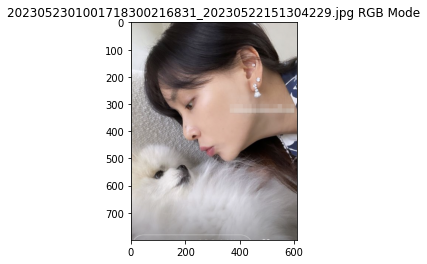

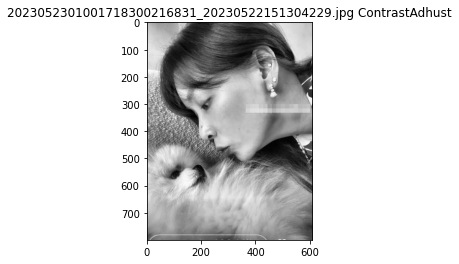

얼굴 영역rectangles[]


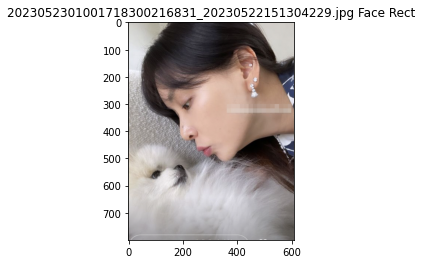

rectangles[]


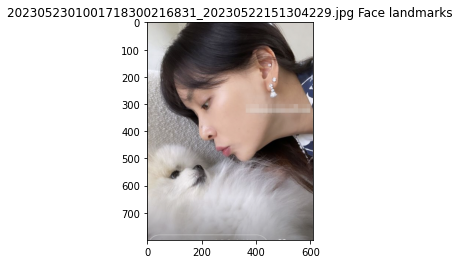

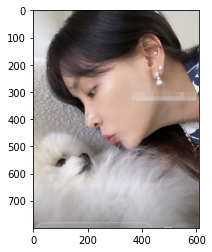

AMI7A2787.jpg


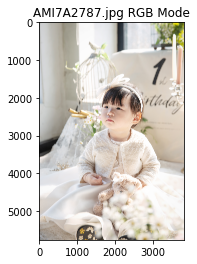

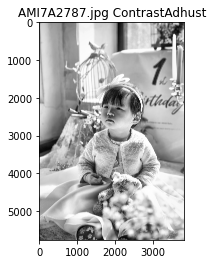

얼굴 영역rectangles[]


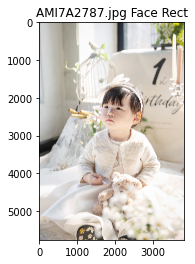

rectangles[]


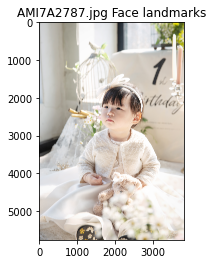

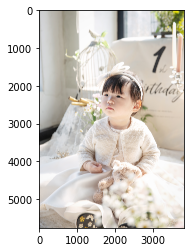

0001255653_001_20230522173501224.jpg


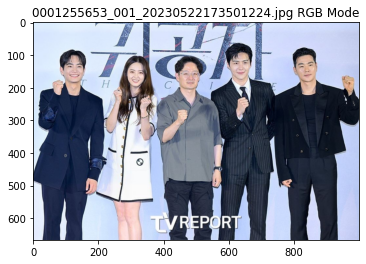

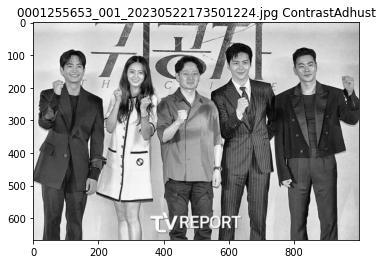

얼굴 영역rectangles[[(605, 108) (667, 170)], [(287, 135) (349, 198)], [(453, 142) (515, 205)], [(805, 115) (868, 177)], [(93, 122) (156, 184)]]


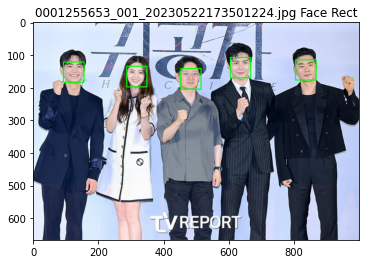

rectangles[[(605, 108) (667, 170)], [(287, 135) (349, 198)], [(453, 142) (515, 205)], [(805, 115) (868, 177)], [(93, 122) (156, 184)]]


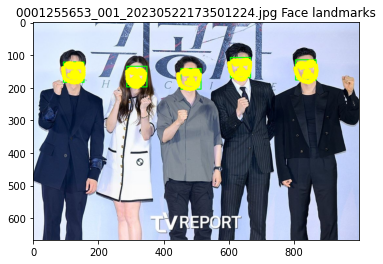

(639, 148)
(x,y) : (608,117)
(x,y) : (608,117)


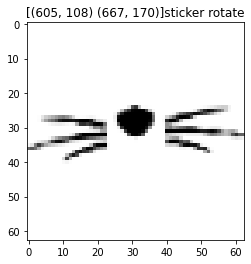

(316, 173)
(x,y) : (285,141)
(x,y) : (285,141)


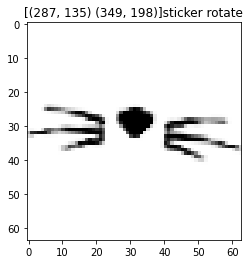

(485, 178)
(x,y) : (454,146)
(x,y) : (454,146)


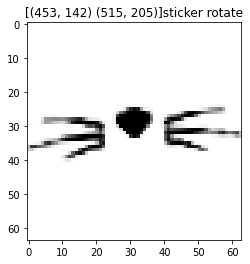

(841, 153)
(x,y) : (809,122)
(x,y) : (809,122)


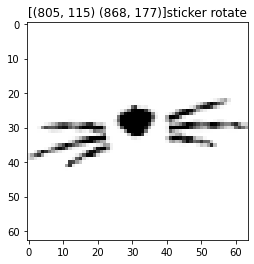

(128, 155)
(x,y) : (96,124)
(x,y) : (96,124)


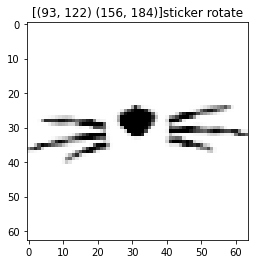

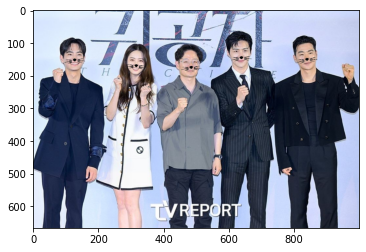

2jin.JPG


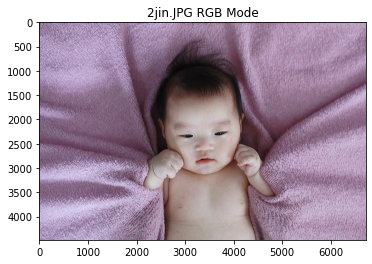

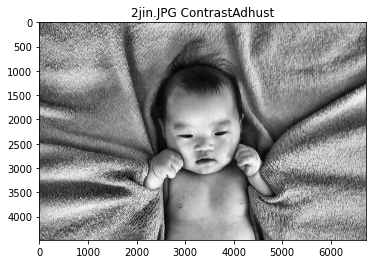

얼굴 영역rectangles[[(653, 4338) (716, 4400)], [(2361, 398) (2423, 460)]]


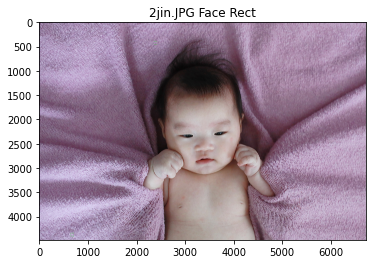

rectangles[[(653, 4338) (716, 4400)], [(2361, 398) (2423, 460)]]


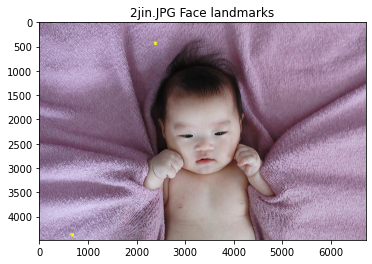

(690, 4379)
(x,y) : (658,4348)
(x,y) : (658,4348)


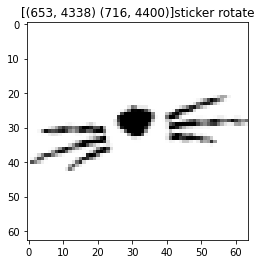

(2390, 440)
(x,y) : (2359,409)
(x,y) : (2359,409)


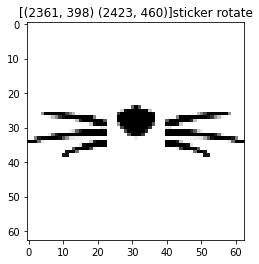

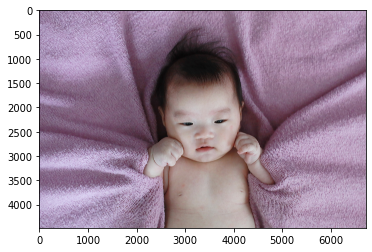

AMI7A2923.jpg


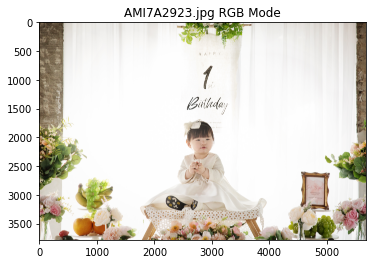

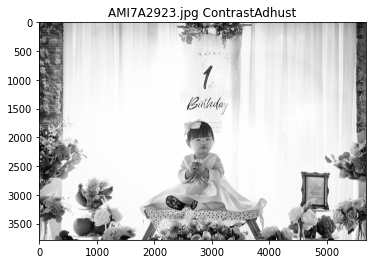

얼굴 영역rectangles[[(2643, 1959) (3029, 2344)]]


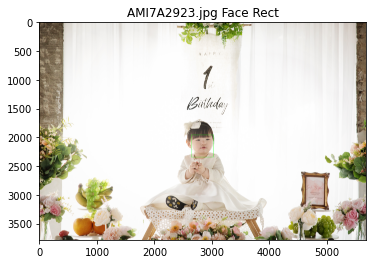

rectangles[[(2643, 1959) (3029, 2344)]]


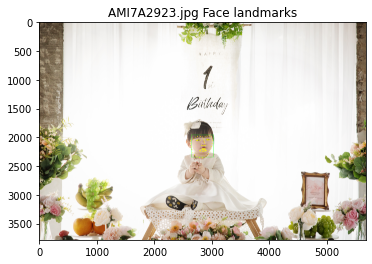

(2861, 2144)
(x,y) : (2668,1951)
(x,y) : (2668,1951)


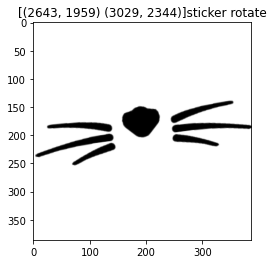

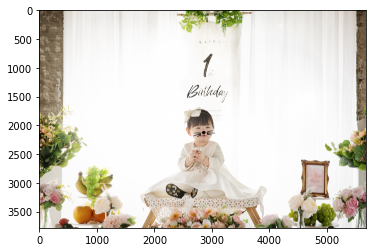

In [15]:
#명암조절 추가 -> 못찾는건 여전히 못찾고, 이상한걸 얼굴로 찾았다

path = '/aiffel/aiffel/camera_sticker/images/'
file_list = os.listdir(path)
file_list_jpg = [file for file in file_list if file.endswith(".jpg") or file.endswith(".JPG")]
for my_image_path in file_list_jpg :
    print(my_image_path)
    img_bgr, fileNm, img_show, img_rgb = imageLoad(path+my_image_path)#이미지 로딩
    img_rgb = contrastAdhust(img_bgr,fileNm)
    dlib_rects = faceDetect(img_rgb,img_show,fileNm)#얼굴 탐색
    list_landmarks = faceLandMark(dlib_rects,fileNm)#이목구비 탐색
    list_img_sticker_coord = makeSticker(dlib_rects,list_landmarks)#스티커 변형
#     attachSticker(list_img_sticker_coord, img_show)#스티커 붙이기
#     plt.figure(figsize=(30, 30))
    attachSticker(list_img_sticker_coord, img_bgr)#스티커 붙이기

2023052301001718300216831_20230522151304229.jpg


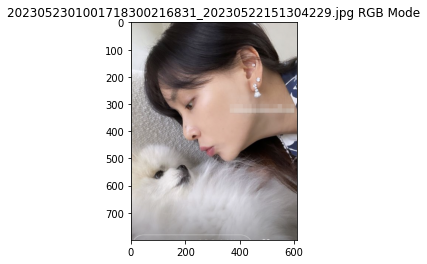

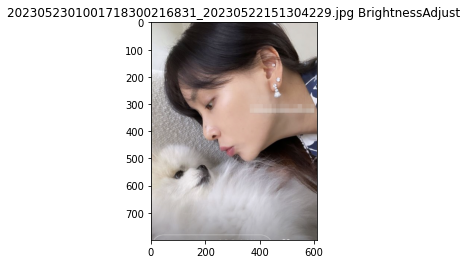

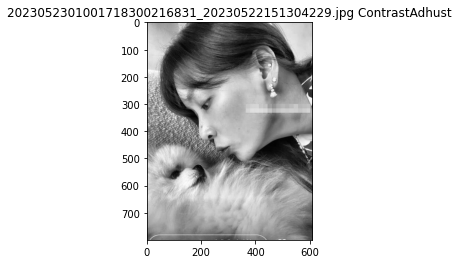

얼굴 영역rectangles[]


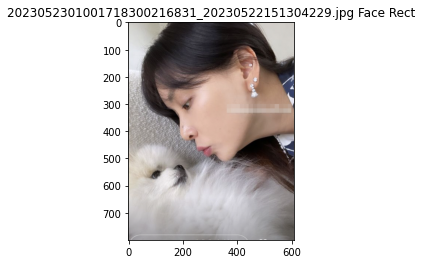

rectangles[]


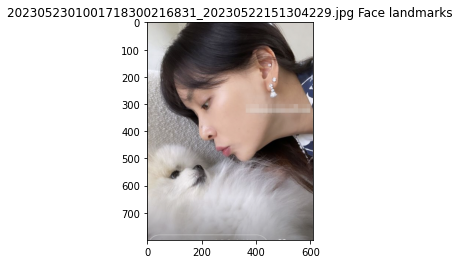

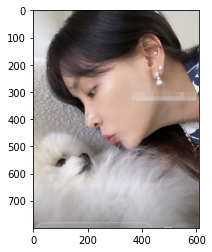

AMI7A2787.jpg


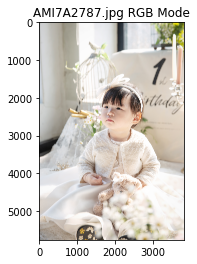

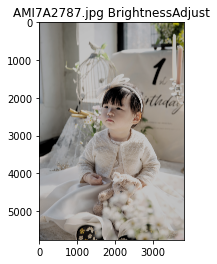

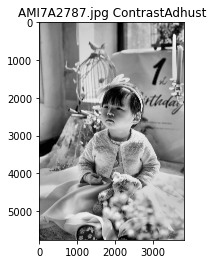

얼굴 영역rectangles[]


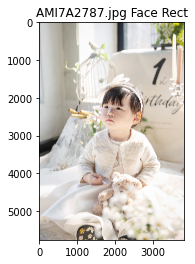

rectangles[]


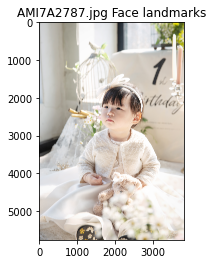

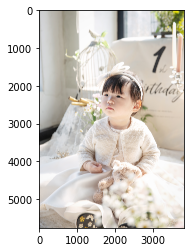

0001255653_001_20230522173501224.jpg


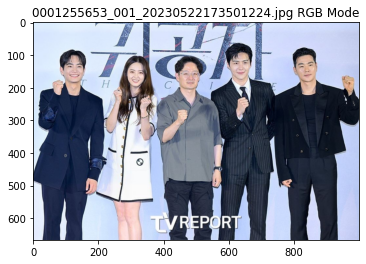

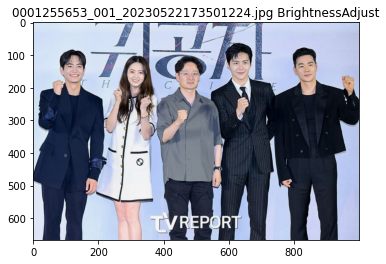

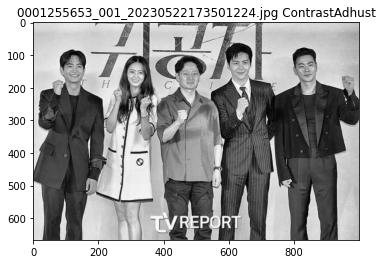

얼굴 영역rectangles[[(605, 108) (667, 170)], [(287, 135) (349, 198)], [(453, 142) (515, 205)], [(805, 115) (868, 177)], [(93, 122) (156, 184)]]


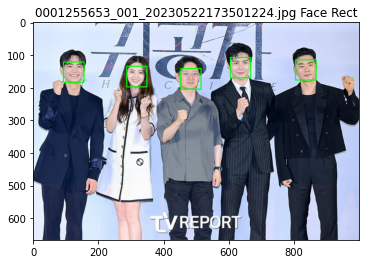

rectangles[[(605, 108) (667, 170)], [(287, 135) (349, 198)], [(453, 142) (515, 205)], [(805, 115) (868, 177)], [(93, 122) (156, 184)]]


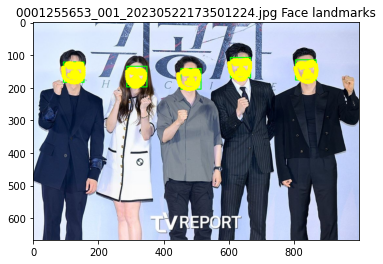

(639, 147)
(x,y) : (608,116)
(x,y) : (608,116)


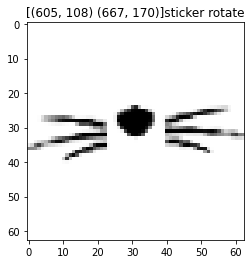

(315, 172)
(x,y) : (284,140)
(x,y) : (284,140)


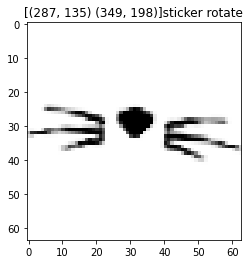

(484, 178)
(x,y) : (453,146)
(x,y) : (453,146)


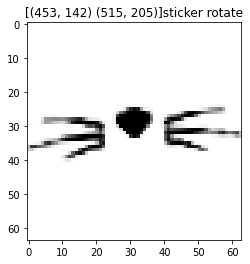

(841, 153)
(x,y) : (809,122)
(x,y) : (809,122)


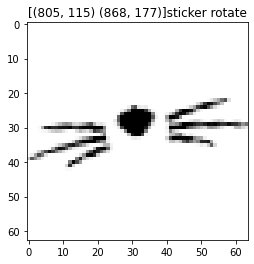

(128, 155)
(x,y) : (96,124)
(x,y) : (96,124)


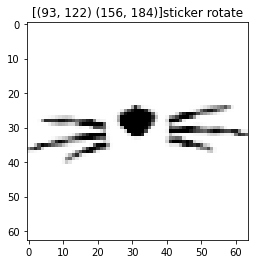

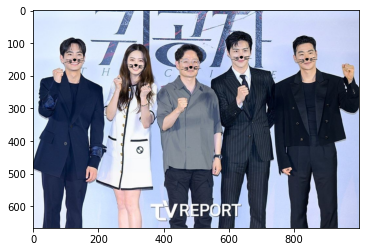

2jin.JPG


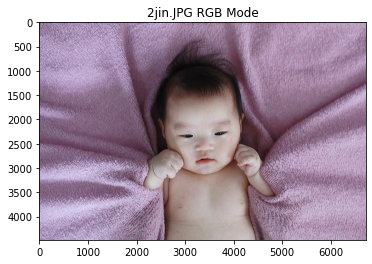

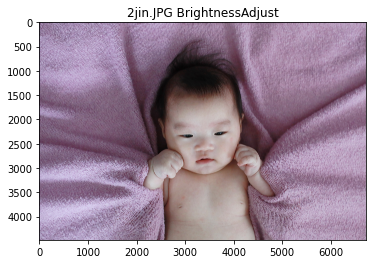

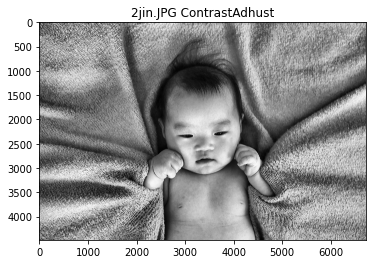

얼굴 영역rectangles[[(2361, 398) (2423, 460)], [(653, 4338) (716, 4400)]]


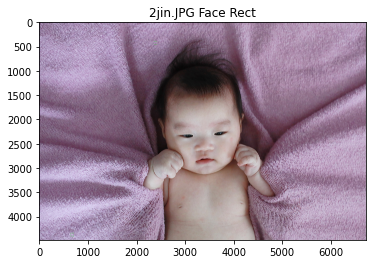

rectangles[[(2361, 398) (2423, 460)], [(653, 4338) (716, 4400)]]


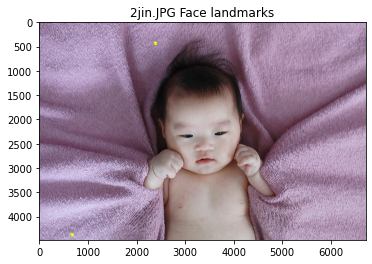

(2390, 440)
(x,y) : (2359,409)
(x,y) : (2359,409)


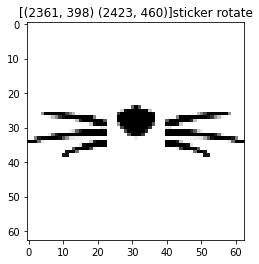

(689, 4378)
(x,y) : (657,4347)
(x,y) : (657,4347)


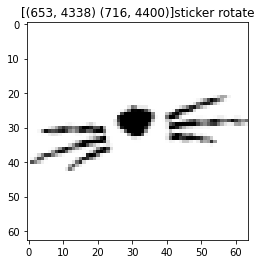

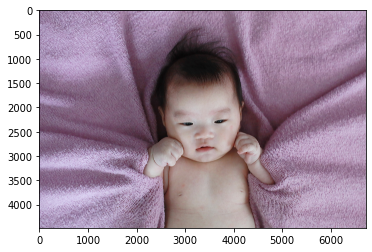

AMI7A2923.jpg


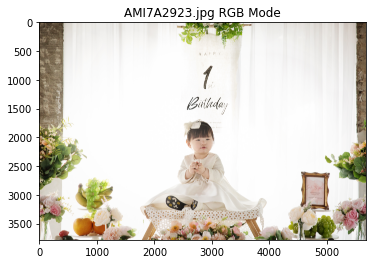

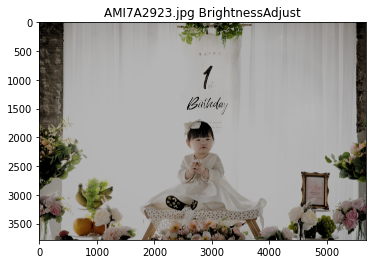

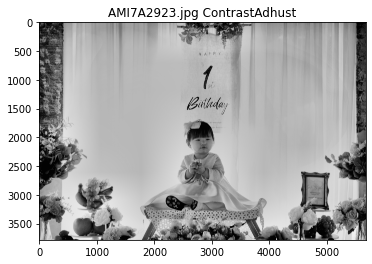

얼굴 영역rectangles[[(2643, 1916) (3029, 2302)]]


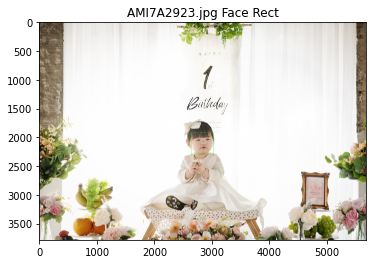

rectangles[[(2643, 1916) (3029, 2302)]]


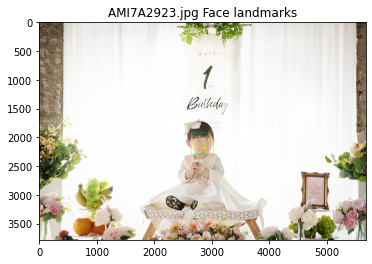

(2858, 2138)
(x,y) : (2665,1945)
(x,y) : (2665,1945)


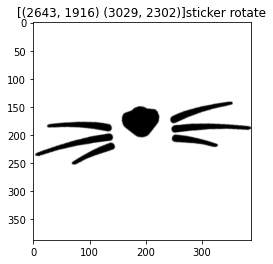

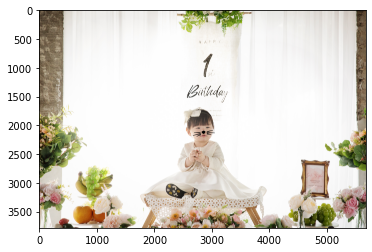

In [16]:
#명암/밝기조절 추가 -> 못찾는건 여전히 못찾고, 이상한걸 얼굴로 찾았다
path = '/aiffel/aiffel/camera_sticker/images/'
file_list = os.listdir(path)
file_list_jpg = [file for file in file_list if file.endswith(".jpg") or file.endswith(".JPG")]
for my_image_path in file_list_jpg :
    print(my_image_path)
    img_bgr, fileNm, img_show, img_rgb = imageLoad(path+my_image_path)#이미지 로딩
    img_rgb = cv2.cvtColor(brightnessAdjust(img_bgr,fileNm), cv2.COLOR_BGR2RGB)
    img_rgb = contrastAdhust(cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR),fileNm)
    dlib_rects = faceDetect(img_rgb,img_show,fileNm)#얼굴 탐색
    list_landmarks = faceLandMark(dlib_rects,fileNm)#이목구비 탐색
    list_img_sticker_coord = makeSticker(dlib_rects,list_landmarks)#스티커 변형
#     attachSticker(list_img_sticker_coord, img_show)#스티커 붙이기
#     plt.figure(figsize=(30, 30))
    attachSticker(list_img_sticker_coord, img_bgr)#스티커 붙이기

명암조절, 밝기조절을 적용해 보았는데, 테스트 이미지로는 효과가 없었다.
오히려 오탐색이 생기기도 했다.
얼굴 detecting을 높이기 위한 방안이 필요하다.